#this is the part of code which clones the github repo of GroundingDino

In [ ]:
!git clone https://github.com/IDEA-Research/Grounded-Segment-Anything
!mv Grounded-Segment-Anything/* .
!rm -R Grounded-Segment-Anything/
!pip install -q -r requirements.txt
%cd /content/GroundingDINO
!pip install -q .
%cd /content/segment_anything
!pip install -q .
%cd /content
!pip install accelerate

Cloning into 'Grounded-Segment-Anything'...
remote: Enumerating objects: 1807, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 1807 (delta 11), reused 24 (delta 1), pack-reused 1766 (from 1)
Receiving objects: 100% (1807/1807), 155.84 MiB | 17.50 MiB/s, done.
Resolving deltas: 100% (831/831), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 10.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 65.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181

# we have used different pre-trained diffusion models and setteled with stabilityai/stable-diffusion-2-1 which gave good images with comparitively faster image generations.

In [ ]:
from diffusers import DiffusionPipeline
import torch
import numpy as np
from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
sd_pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

prompts or image titles used by GroundingDino to generate images which are generated by chatgpt.

In [ ]:
chatgpt_response = [
    "A single small birthday balloon floating in a park, photo, 4k, high resolution",
    "A single small birthday balloon tied to a chair in a garden, photo, 4k, high resolution",
    "A single small birthday balloon in a child's hand at a birthday party, photo, 4k, high resolution",
    "A single small birthday balloon on a sandy beach, gently swaying in the wind, photo, 4k, high resolution",
    "A baby holding a small birthday balloon",
    "A single small birthday balloon on a wooden table in a cozy living room, photo, 4k, high resolution",
    "A single small birthday balloon flying over a cityscape at sunset, photo, 4k, high resolution",
    "A single small birthday balloon in a forest clearing surrounded by trees, photo, 4k, high resolution",
    "A single small birthday balloon floating near a mountain lake, photo, 4k, high resolution",
    "A single small birthday balloon attached to a bicycle in a field of flowers, photo, 4k, high resolution",
    "A single small birthday balloon under a bright blue sky with fluffy clouds, photo, 4k, high resolution",
    "A single small birthday balloon in a modern kitchen, tied to a chair, photo, 4k, high resolution",
    "A single small birthday balloon floating in an empty parking lot, photo, 4k, high resolution",
    "A single small birthday balloon stuck in a tree in a park, photo, 4k, high resolution",
    "A single small birthday balloon floating over a calm ocean at sunrise, photo, 4k, high resolution",
    "A single small birthday balloon next to a stack of colorful gift boxes, photo, 4k, high resolution",
    "A single small birthday balloon in a busy urban street during the day, photo, 4k, high resolution",
    "A single small birthday balloon on a playground swing, gently moving, photo, 4k, high resolution",
    "A single small birthday balloon in a cozy cafe by the window, photo, 4k, high resolution",
    "A single small birthday balloon tied to a park bench, photo, 4k, high resolution",
    "A single small birthday balloon in a snowy winter landscape, photo, 4k, high resolution",
    "A single small birthday balloon in a child's room filled with toys, photo, 4k, high resolution",
    "A single small birthday balloon floating near an old stone bridge, photo, 4k, high resolution",
    "A single small birthday balloon in a vibrant city carnival setting, photo, 4k, high resolution",
    "A single small birthday balloon floating near a cozy campfire at night, photo, 4k, high resolution",
    "A single small birthday balloon on a rooftop terrace with string lights, photo, 4k, high resolution",
    "A single small birthday balloon at a picnic in a sunny meadow, photo, 4k, high resolution",
    "A single small birthday balloon in a brightly lit science laboratory, photo, 4k, high resolution",
    "A single small birthday balloon tied to a colorful chair at a festival, photo, 4k, high resolution",
    "A single small birthday balloon in a school classroom on a desk, photo, 4k, high resolution",
    "A single small birthday balloon in a vintage-style room with a fireplace, photo, 4k, high resolution",
    "A single small birthday balloon in a futuristic sci-fi environment, photo, 4k, high resolution",
    "A single small birthday balloon in a grassy field during a sunset, photo, 4k, high resolution",
    "A single small birthday balloon in a rustic barn setting, photo, 4k, high resolution",
    "A single small birthday balloon on a city rooftop during a rainy evening, photo, 4k, high resolution",
    "A single small birthday balloon in a minimalist white room, photo, 4k, high resolution",
    "A single small birthday balloon floating in an indoor swimming pool area, photo, 4k, high resolution",
    "A single small birthday balloon tied to a boat on a lake, photo, 4k, high resolution",
    "A single small birthday balloon floating over a vast wheat field, photo, 4k, high resolution",
    "A single small birthday balloon near a cliffside overlooking the ocean, photo, 4k, high resolution",
    "A single small birthday balloon in a futuristic space station, photo, 4k, high resolution",
    "A single small birthday balloon in a cozy log cabin with a fireplace, photo, 4k, high resolution",
    "A single small birthday balloon in a bright, colorful toy store, photo, 4k, high resolution",
    "A single small birthday balloon in an urban rooftop garden, photo, 4k, high resolution",
    "A single small birthday balloon in a serene Buddhist temple courtyard, photo, 4k, high resolution",
    "A single small birthday balloon at a summer camp near a bonfire, photo, 4k, high resolution",
    "A single small birthday balloon floating in an aquarium tunnel, photo, 4k, high resolution",
    "A single small birthday balloon tied to a shopping cart in a supermarket, photo, 4k, high resolution",
    "A single small birthday balloon in a rainy forest pathway, photo, 4k, high resolution",
    "A scene with round objects like balls, but no balloons, photo, 4k, high resolution",
    "A table with round fruits like oranges and apples, no balloons, photo, 4k, high resolution"
]

#this is the part of code which generates the images.

In [ ]:
import os
import numpy as np
from PIL import Image

# Define the directory to save images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

negative_prompt = "low resolution, ugly, naked, nude"
num_batches = len(chatgpt_response)
num_images_per_batch = 2

generated_images = []
for i in range(num_batches):
    batch = sd_pipe(
        prompt=chatgpt_response[i],
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_images_per_batch,
        height=640,
        width=640
    )

    # Process each image in the batch
    for j, batch_image in enumerate(batch.images):
        image_array = np.array(batch_image)
        generated_images.append(image_array)

        # Save the image to a file
        image = Image.fromarray(image_array)
        image_file_path = os.path.join(output_dir, f"batch_{i}_image_{j}.png")
        image.save(image_file_path)
        print(f"Saved: {image_file_path}")


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_0_image_0.png
Saved: generated_images/batch_0_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_1_image_0.png
Saved: generated_images/batch_1_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_2_image_0.png
Saved: generated_images/batch_2_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_3_image_0.png
Saved: generated_images/batch_3_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_4_image_0.png
Saved: generated_images/batch_4_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_5_image_0.png
Saved: generated_images/batch_5_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_6_image_0.png
Saved: generated_images/batch_6_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_7_image_0.png
Saved: generated_images/batch_7_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_8_image_0.png
Saved: generated_images/batch_8_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_9_image_0.png
Saved: generated_images/batch_9_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_10_image_0.png
Saved: generated_images/batch_10_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_11_image_0.png
Saved: generated_images/batch_11_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_12_image_0.png
Saved: generated_images/batch_12_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_13_image_0.png
Saved: generated_images/batch_13_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_14_image_0.png
Saved: generated_images/batch_14_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_15_image_0.png
Saved: generated_images/batch_15_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_16_image_0.png
Saved: generated_images/batch_16_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_17_image_0.png
Saved: generated_images/batch_17_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_18_image_0.png
Saved: generated_images/batch_18_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_19_image_0.png
Saved: generated_images/batch_19_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_20_image_0.png
Saved: generated_images/batch_20_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_21_image_0.png
Saved: generated_images/batch_21_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_22_image_0.png
Saved: generated_images/batch_22_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_23_image_0.png
Saved: generated_images/batch_23_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_24_image_0.png
Saved: generated_images/batch_24_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_25_image_0.png
Saved: generated_images/batch_25_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_26_image_0.png
Saved: generated_images/batch_26_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_27_image_0.png
Saved: generated_images/batch_27_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_28_image_0.png
Saved: generated_images/batch_28_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_29_image_0.png
Saved: generated_images/batch_29_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_30_image_0.png
Saved: generated_images/batch_30_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_31_image_0.png
Saved: generated_images/batch_31_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_32_image_0.png
Saved: generated_images/batch_32_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_33_image_0.png
Saved: generated_images/batch_33_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_34_image_0.png
Saved: generated_images/batch_34_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_35_image_0.png
Saved: generated_images/batch_35_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_36_image_0.png
Saved: generated_images/batch_36_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_37_image_0.png
Saved: generated_images/batch_37_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_38_image_0.png
Saved: generated_images/batch_38_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_39_image_0.png
Saved: generated_images/batch_39_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_40_image_0.png
Saved: generated_images/batch_40_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_41_image_0.png
Saved: generated_images/batch_41_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_42_image_0.png
Saved: generated_images/batch_42_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_43_image_0.png
Saved: generated_images/batch_43_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_44_image_0.png
Saved: generated_images/batch_44_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_45_image_0.png
Saved: generated_images/batch_45_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_46_image_0.png
Saved: generated_images/batch_46_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_47_image_0.png
Saved: generated_images/batch_47_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_48_image_0.png
Saved: generated_images/batch_48_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_49_image_0.png
Saved: generated_images/batch_49_image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_50_image_0.png
Saved: generated_images/batch_50_image_1.png


#visualizing the generated images.

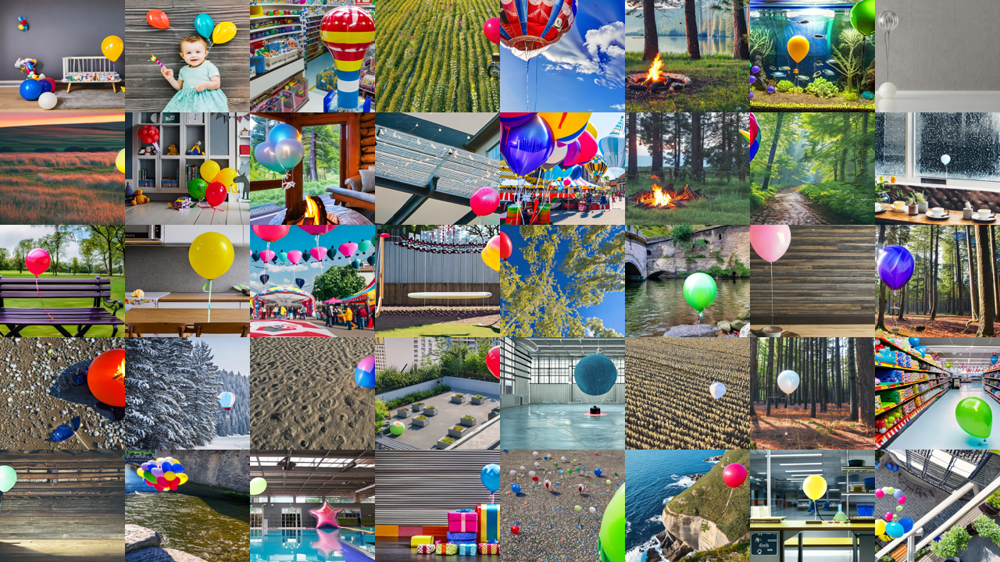

In [ ]:
def mosaic_sample(list_of_arrays, nrows=5, ncols=8):
    random_choose = np.arange(0,len(list_of_arrays), 1)
    np.random.shuffle(random_choose)
    random_choose = random_choose[:nrows*ncols]
    out_w, out_h = 1280, 720
    d_w, d_h = out_w//ncols, out_h//nrows
    out = np.zeros((out_h, out_w, 3), dtype=np.uint8)
    row = 0
    col = 0
    for choose in random_choose:
        choosen_image = Image.fromarray(list_of_arrays[choose]
                                        ).resize((d_w, d_h))
        out[row*d_h:row*d_h + d_h,
            col*d_w:col*d_w + d_w,
            :] = np.array(choosen_image)
        row += 1
        if row == nrows:
            row = 0
            col += 1
    return out

Image.fromarray(mosaic_sample(generated_images, nrows=5, ncols=8))

creating a zip file to download the generated images folder

In [ ]:
import shutil

# Define the input folder and output zip file path
input_folder = "/content/generated_images"
output_zip = "/content/generated_images_final.zip"

# Create the zip archive
shutil.make_archive(output_zip.replace(".zip", ""), 'zip', input_folder)

print(f"Zip archive created at {output_zip}")


In [ ]:
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

# the annotations for the generated images are done manually using cvat tool and using the generated images i trained the yolov8n.pt pretrained model .

In [1]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define paths
image_folder = "/content/drive/MyDrive/generated_images_balloons"
annotation_folder = "/content/drive/MyDrive/job_1764157_annotations_2024_11_29_08_17_59_yolo 1.1/obj_train_data"
dataset_path = "/content/drive/MyDrive/yolo_dataset"
os.makedirs(dataset_path, exist_ok=True)

# YOLO dataset structure
images_train = os.path.join(dataset_path, "images/train")
images_val = os.path.join(dataset_path, "images/val")
labels_train = os.path.join(dataset_path, "labels/train")
labels_val = os.path.join(dataset_path, "labels/val")

for folder in [images_train, images_val, labels_train, labels_val]:
    os.makedirs(folder, exist_ok=True)

# Gather all images and annotations
images = sorted([f for f in os.listdir(image_folder) if f.endswith(".png")])
annotations = sorted([f for f in os.listdir(annotation_folder) if f.endswith(".txt")])

# Ensure image-annotation pair alignment
assert len(images) == len(annotations), "Mismatch between images and annotation files!"

# Split into train and validation sets
train_images, val_images = train_test_split(images, test_size=0.2, random_state=42)

# Helper to move files to YOLO structure
def move_files(images, split_folder, label_folder):
    for image_file in images:
        # Copy image
        shutil.copy(
            os.path.join(image_folder, image_file),
            os.path.join(split_folder, image_file)
        )

        # Corresponding annotation
        annotation_file = image_file.replace(".png", ".txt")
        shutil.copy(
            os.path.join(annotation_folder, annotation_file),
            os.path.join(label_folder, annotation_file)
        )

# Organize training and validation data
move_files(train_images, images_train, labels_train)
move_files(val_images, images_val, labels_val)

# Write the data.yaml file
data_yaml = os.path.join(dataset_path, "data.yaml")
with open(data_yaml, "w") as f:
    f.write(f"""
train: {images_train}
val: {images_val}

nc: 1  # Number of classes
names: ['balloon']  # Class names
""")
print(f"`data.yaml` created at: {data_yaml}")

# Install YOLO (Ultralytics library)
!pip install ultralytics

# Import YOLO library and train
from ultralytics import YOLO

# Load the model
model = YOLO("yolov8n.pt")  # Use YOLOv8 nano for speed and efficiency

# Train the model
model.train(
    data=data_yaml,
    epochs=20,  # Adjust epochs as needed
    batch=8,    # Adjust batch size as needed
    imgsz=640,  # Image size
    project="/content/drive/MyDrive/yolo_results",  # Save results here
    name="balloon_detection",
    augment=True  # Enable data augmentation
)

# Evaluate the model
results = model.val()
print("Validation Results:")
print(results)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
`data.yaml` created at: /content/drive/MyDrive/yolo_dataset/data.yaml
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/yolo_dataset/data.yaml, epochs=20, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_results, name=balloon_detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None

train: Scanning /content/drive/MyDrive/yolo_dataset/labels/train... 81 images, 23 backgrounds, 0 corrupt: 100%|██████████| 81/81 [00:00<00:00, 129.43it/s]

train: New cache created: /content/drive/MyDrive/yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/yolo_dataset/labels/val... 21 images, 5 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<00:00, 80.28it/s]

val: New cache created: /content/drive/MyDrive/yolo_dataset/labels/val.cache


Plotting labels to /content/drive/MyDrive/yolo_results/balloon_detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_results/balloon_detection
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      1.21G      1.359      3.705      1.501          2        640: 100%|██████████| 11/11 [00:03<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.32it/s]

                   all         21         35    0.00556          1      0.319      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      1.18G      1.004      2.589      1.161          2        640: 100%|██████████| 11/11 [00:02<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.00it/s]

                   all         21         35    0.00556          1       0.49      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      1.17G      1.038      2.128      1.204          2        640: 100%|██████████| 11/11 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         21         35    0.00556          1      0.529      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      1.18G     0.9788      2.532      1.041          0        640: 100%|██████████| 11/11 [00:03<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]

                   all         21         35          1      0.243      0.666      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      1.18G      1.082      1.886      1.173          5        640: 100%|██████████| 11/11 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.62it/s]

                   all         21         35      0.902      0.263      0.659      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      1.16G     0.9912       2.58      1.105          0        640: 100%|██████████| 11/11 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.93it/s]

                   all         21         35      0.746      0.657      0.731      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      1.18G      1.149       1.65      1.263          8        640: 100%|██████████| 11/11 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.05it/s]

                   all         21         35      0.782      0.629      0.725      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      1.17G       1.07      1.667      1.188          1        640: 100%|██████████| 11/11 [00:02<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         21         35      0.817       0.51      0.573      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      1.17G     0.9191       2.07      1.017          0        640: 100%|██████████| 11/11 [00:03<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         21         35      0.685      0.683      0.661      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      1.17G     0.9141      2.115      1.018          0        640: 100%|██████████| 11/11 [00:02<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]

                   all         21         35      0.807      0.629      0.665      0.467


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      1.17G      0.868      2.322      1.032          0        640: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all         21         35      0.786      0.571      0.671      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      1.17G     0.8892      2.225      1.005          0        640: 100%|██████████| 11/11 [00:03<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         21         35      0.688      0.629      0.689       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      1.18G     0.9196      1.769      1.097          1        640: 100%|██████████| 11/11 [00:02<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         21         35      0.623      0.657      0.658      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      1.18G     0.8117      1.999     0.9833          0        640: 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         21         35      0.687      0.627      0.684      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      1.18G     0.8631      1.476      1.051          1        640: 100%|██████████| 11/11 [00:01<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.03it/s]

                   all         21         35       0.63      0.657      0.642      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      1.18G     0.8814      1.751      1.101          5        640: 100%|██████████| 11/11 [00:01<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.19it/s]

                   all         21         35      0.673      0.657       0.64      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      1.18G     0.8037      2.179     0.9572          0        640: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         21         35      0.633      0.686      0.665      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      1.17G     0.7402      1.896     0.9152          0        640: 100%|██████████| 11/11 [00:02<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         21         35      0.685      0.683       0.67       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      1.18G     0.8374      1.628      1.041          1        640: 100%|██████████| 11/11 [00:01<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.43it/s]

                   all         21         35      0.679      0.686      0.683      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      1.17G     0.8071      1.822      1.019          4        640: 100%|██████████| 11/11 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.79it/s]

                   all         21         35      0.685      0.657      0.705      0.508



20 epochs completed in 0.023 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_results/balloon_detection/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/yolo_results/balloon_detection/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/yolo_results/balloon_detection/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]


                   all         21         35       0.77      0.571      0.681      0.487
Speed: 0.3ms preprocess, 34.1ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results/balloon_detection
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_dataset/labels/val.cache... 21 images, 5 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]


                   all         21         35       0.77      0.571      0.681      0.494
Speed: 0.3ms preprocess, 95.3ms inference, 0.0ms loss, 9.8ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results/balloon_detection2
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x797c94b4d390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    

testing the model with the best weights on a set of images taken from a kaggle dataset of balloons.


image 1/10 /content/drive/MyDrive/test_baloon_images/120853323_d4788431b9_b.jpg: 448x640 3 balloons, 7.0ms
image 2/10 /content/drive/MyDrive/test_baloon_images/126700562_8e27720147_b.jpg: 480x640 (no detections), 8.9ms
image 3/10 /content/drive/MyDrive/test_baloon_images/145053828_e0e748717c_b.jpg: 480x640 5 balloons, 8.5ms
image 4/10 /content/drive/MyDrive/test_baloon_images/154446334_5d41cd1375_b.jpg: 480x640 1 balloon, 6.8ms
image 5/10 /content/drive/MyDrive/test_baloon_images/155815494_800fc9aa32_b.jpg: 640x480 1 balloon, 7.1ms
image 6/10 /content/drive/MyDrive/test_baloon_images/321888854_3723b6f10b_b.jpg: 480x640 (no detections), 7.0ms
image 7/10 /content/drive/MyDrive/test_baloon_images/332344155_71be3a3b22_b.jpg: 544x640 1 balloon, 7.9ms
image 8/10 /content/drive/MyDrive/test_baloon_images/351678851_e2aeebdafd_b.jpg: 640x480 4 balloons, 7.0ms
image 9/10 /content/drive/MyDrive/test_baloon_images/410488422_5f8991f26e_b.jpg: 480x640 3 balloons, 7.3ms
image 10/10 /content/drive/My

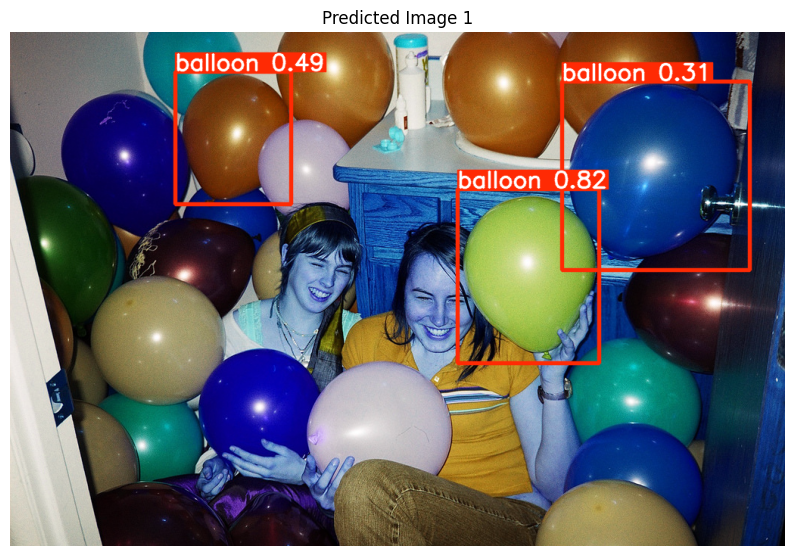

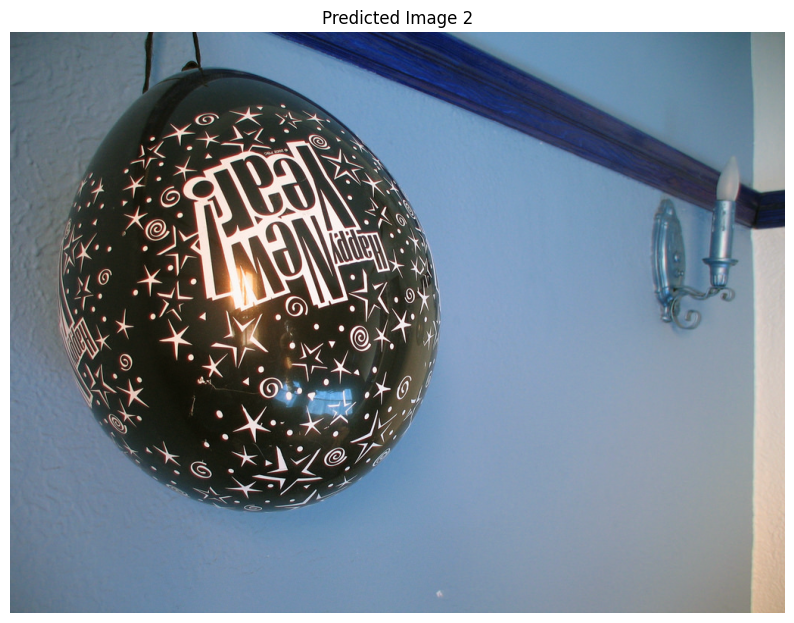

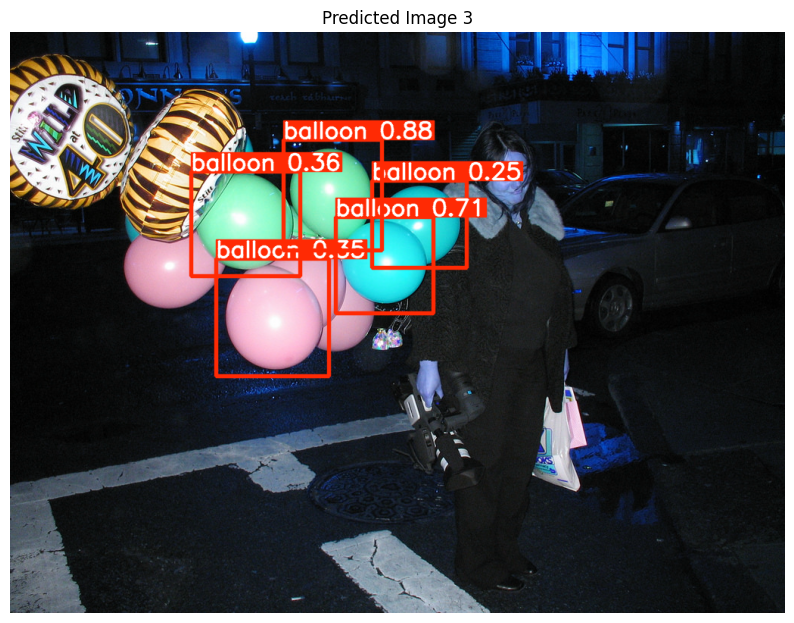

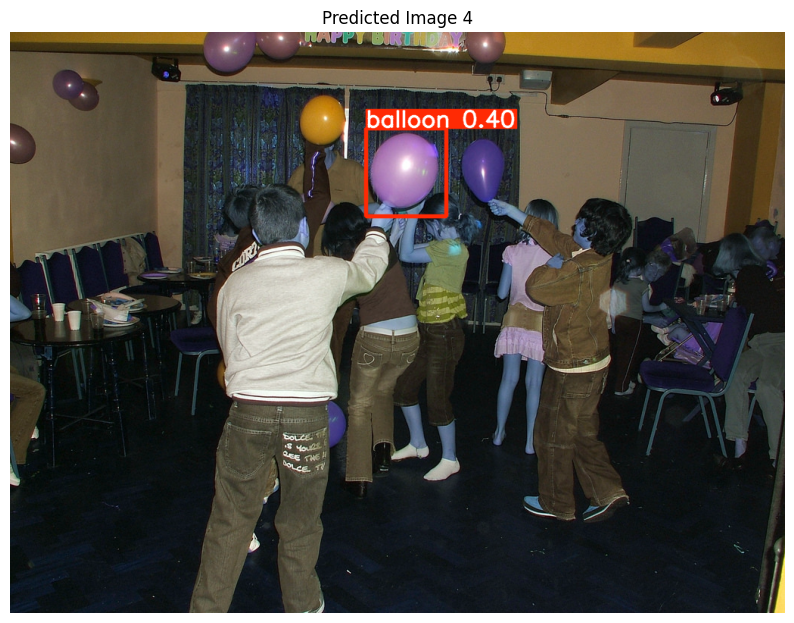

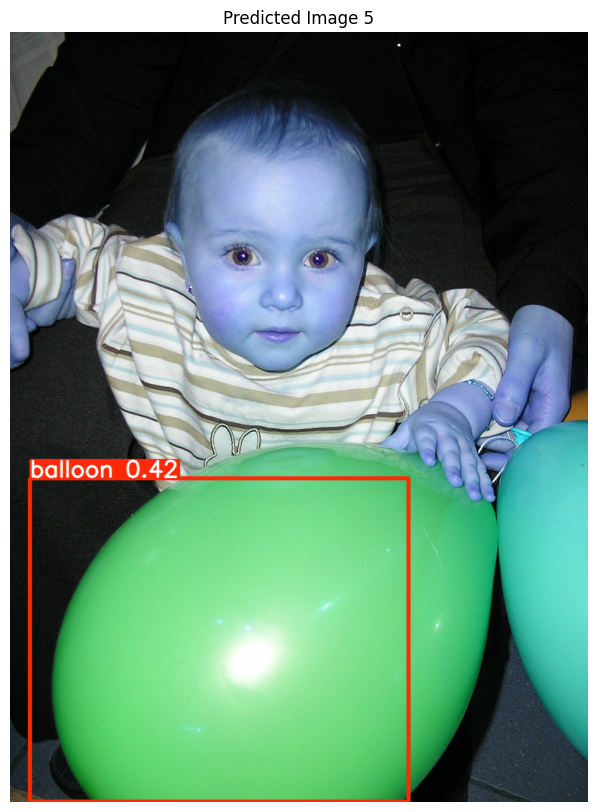

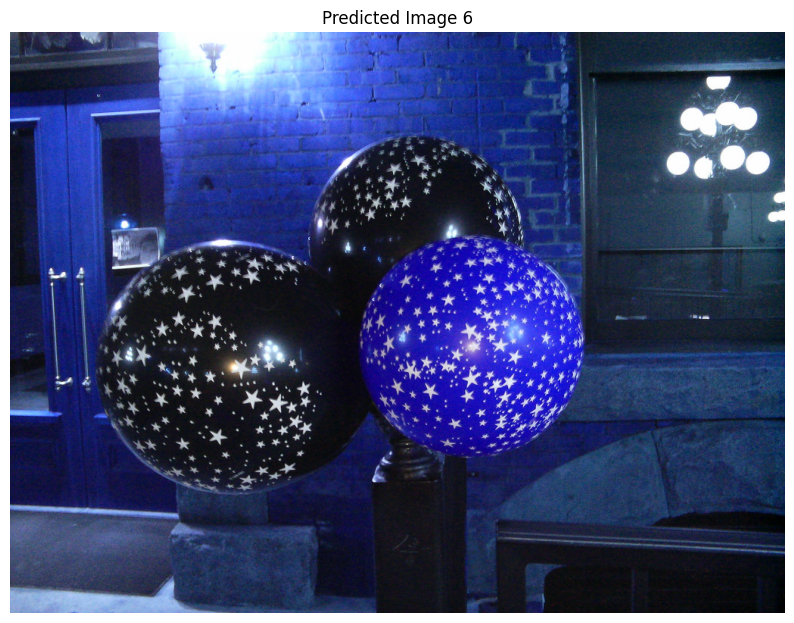

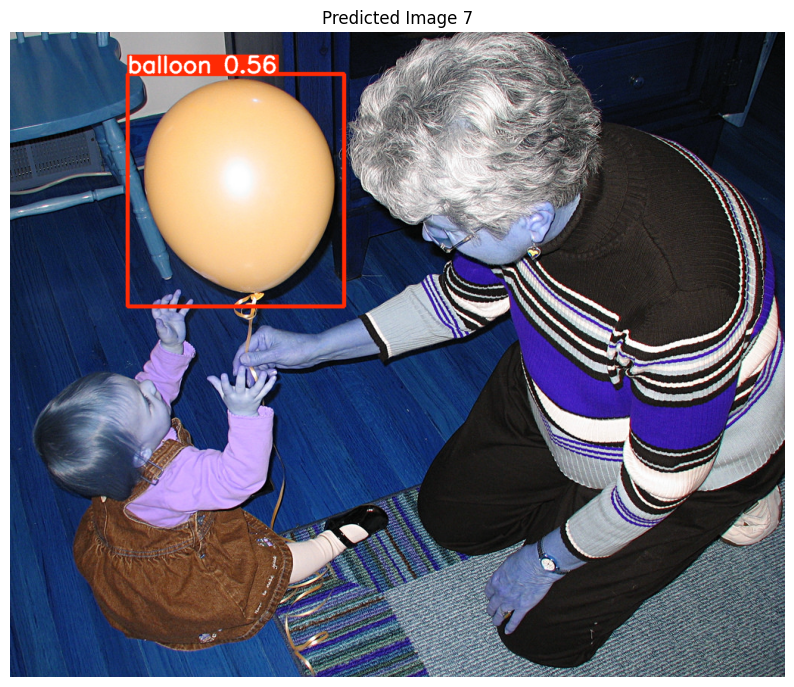

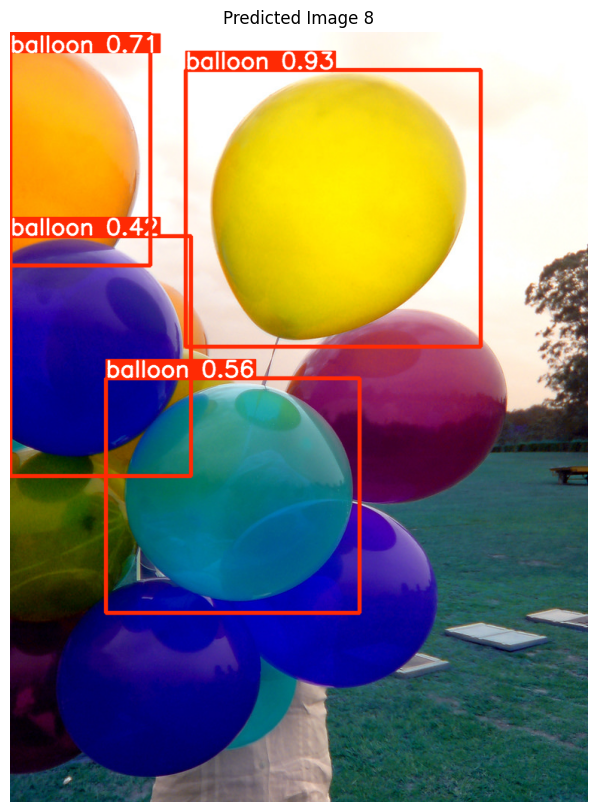

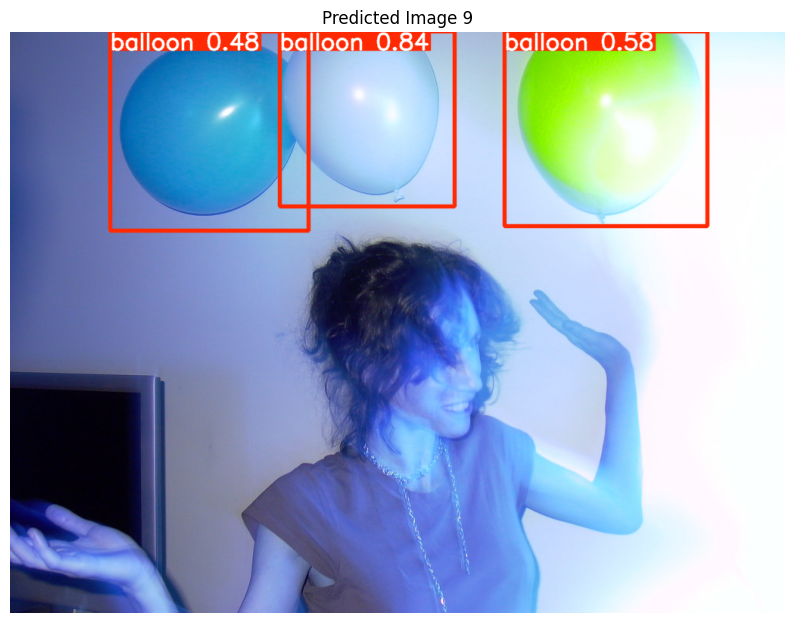

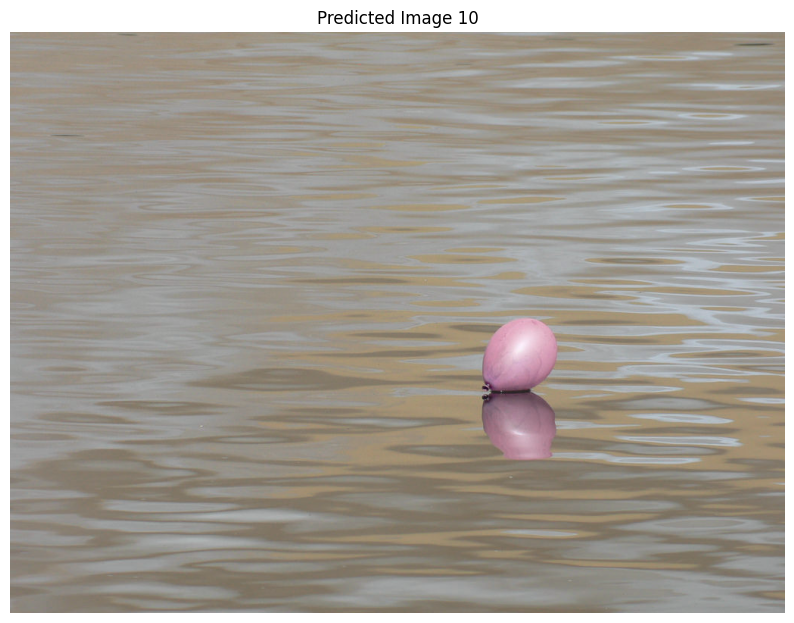

In [3]:
from ultralytics import YOLO
from matplotlib import pyplot as plt

# Load the trained model
model = YOLO("/content/drive/MyDrive/yolo_results/balloon_detection/weights/best.pt")

# Perform inference on the images in the specified folder
results = model.predict(
    source="/content/drive/MyDrive/test_baloon_images",
    imgsz=640,
    conf=0.25,
    save=False  # Do not save results
)

# Plot up to 10 predicted images
for i, result in enumerate(results[:10]):  # Limit to 10 images
    # Convert the predicted result to a NumPy array with annotations
    pred_image = result.plot()

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(pred_image)
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted Image {i + 1}")
    plt.show()


# I trained the yolov8n.pt pretrained model using the kaggle dataset balloon images (real images)

Mounted at /content/drive
Image not found, skipping: 145053828_e0e748717c_b.jpg
Image not found, skipping: 154446334_5d41cd1375_b.jpg
Image not found, skipping: 120853323_d4788431b9_b.jpg
Image not found, skipping: 126700562_8e27720147_b.jpg
Image not found, skipping: 53500107_d24b11b3c2_b.jpg
Image not found, skipping: 155815494_800fc9aa32_b.jpg
`data.yaml` created at: /content/drive/MyDrive/yolo_dataset_kaggle/data.yaml


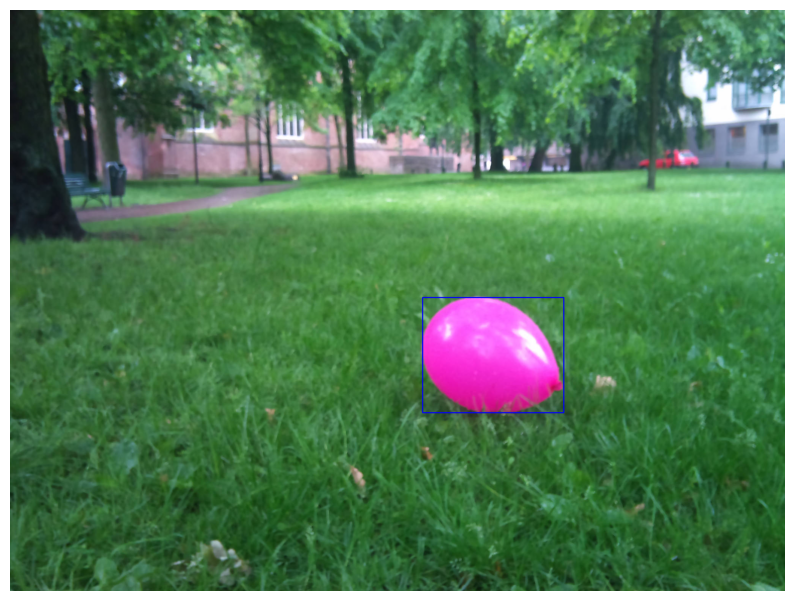

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 28.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 256MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/yolo_dataset_kaggle/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_results_kaggle, name=balloon_detection_kaggle3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=F

100%|██████████| 755k/755k [00:00<00:00, 112MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 271MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/yolo_dataset_kaggle/labels/train.cache... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/yolo_dataset_kaggle/labels/val.cache... 14 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14/14 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.22G     0.7156      3.143      1.125         35        640: 100%|██████████| 4/4 [00:03<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all         14         52    0.00905      0.731      0.142     0.0989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.16G     0.7549      2.917      1.132         54        640: 100%|██████████| 4/4 [00:01<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         14         52     0.0107      0.865        0.3      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.23G     0.6477      2.107      1.025         28        640: 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         14         52      0.982      0.269      0.352      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.23G     0.6812      1.324     0.9582         48        640: 100%|██████████| 4/4 [00:01<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         14         52      0.654      0.365      0.463       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.21G     0.6615      1.116     0.9531         38        640: 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         14         52        0.8      0.404      0.537      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.21G     0.7279      1.191     0.9817         29        640: 100%|██████████| 4/4 [00:00<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.51it/s]


                   all         14         52       0.74      0.423      0.524      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.23G     0.7454      1.172      1.005         50        640: 100%|██████████| 4/4 [00:00<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         14         52      0.728      0.481      0.516      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.19G     0.6318      1.086     0.9584         35        640: 100%|██████████| 4/4 [00:00<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

                   all         14         52      0.918      0.481      0.551      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.22G     0.6974     0.9813     0.9495         45        640: 100%|██████████| 4/4 [00:01<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

                   all         14         52      0.878      0.481      0.571      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       2.2G     0.6631     0.9639     0.9635         58        640: 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all         14         52      0.825      0.545      0.585      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.16G       0.71     0.9181     0.9959         38        640: 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         14         52      0.918      0.538       0.64      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.17G     0.7222     0.9746      1.007         44        640: 100%|██████████| 4/4 [00:00<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


                   all         14         52       0.95      0.519      0.634       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.17G     0.6509     0.9098     0.9518         41        640: 100%|██████████| 4/4 [00:00<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]


                   all         14         52      0.934      0.541       0.66      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.21G     0.6464     0.8238     0.9587         51        640: 100%|██████████| 4/4 [00:00<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         14         52      0.912        0.6       0.68      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.24G     0.5775     0.9273     0.9237         16        640: 100%|██████████| 4/4 [00:01<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]

                   all         14         52      0.914      0.613      0.722        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.19G     0.6291     0.9169     0.9555         38        640: 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         14         52      0.937      0.575      0.669      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.19G      0.651     0.9264     0.9715         55        640: 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         14         52      0.914        0.5      0.605      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       2.2G     0.6064      0.896     0.9308         38        640: 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         14         52      0.969      0.596      0.685      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       2.2G     0.6451     0.8475     0.9598         32        640: 100%|██████████| 4/4 [00:00<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all         14         52      0.964      0.635      0.761      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.23G      0.677       1.12     0.9797          9        640: 100%|██████████| 4/4 [00:01<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

                   all         14         52      0.943      0.636      0.729      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.19G     0.6934      0.784     0.9566         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         14         52      0.904      0.692      0.759      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.25G     0.7339     0.9224      1.006         28        640: 100%|██████████| 4/4 [00:00<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         14         52      0.898      0.654      0.768      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       2.2G     0.7715      0.849     0.9786         84        640: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         14         52      0.845       0.63      0.731      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.19G     0.6336     0.8782     0.9476         44        640: 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         14         52      0.759      0.668      0.722       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.21G     0.7326      0.859      1.006         51        640: 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         14         52      0.782      0.712      0.758      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.19G     0.6578     0.8233     0.9681         25        640: 100%|██████████| 4/4 [00:00<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         14         52      0.926      0.724      0.801      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.2G     0.7223     0.8732     0.9694         59        640: 100%|██████████| 4/4 [00:00<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

                   all         14         52      0.853      0.781      0.813      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.21G     0.7482     0.8366     0.9982         39        640: 100%|██████████| 4/4 [00:00<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

                   all         14         52      0.947      0.692      0.817      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       2.2G     0.5788     0.7502     0.9527         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


                   all         14         52      0.916      0.731      0.813      0.653

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.16G     0.6467     0.8928     0.9542         46        640: 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         14         52      0.803      0.635      0.761      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.23G     0.7419     0.7991     0.9762         41        640: 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         14         52      0.776      0.666      0.753      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       2.2G     0.6634     0.7783      0.942         42        640: 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         14         52      0.773       0.75      0.804      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.21G     0.6085     0.7674      0.974         37        640: 100%|██████████| 4/4 [00:00<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         14         52       0.94      0.712      0.837      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       2.2G     0.6562     0.7206     0.9406         74        640: 100%|██████████| 4/4 [00:00<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]


                   all         14         52      0.978       0.75      0.839      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.17G     0.5631     0.6889     0.9125         51        640: 100%|██████████| 4/4 [00:00<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

                   all         14         52          1      0.706      0.806       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       2.2G     0.5441     0.6819     0.9184         26        640: 100%|██████████| 4/4 [00:00<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


                   all         14         52      0.863      0.729      0.753      0.614

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.21G      0.543     0.6686     0.9035         19        640: 100%|██████████| 4/4 [00:01<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         14         52      0.971      0.653      0.726      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.19G     0.5458     0.6921     0.9103         73        640: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

                   all         14         52      0.918      0.649      0.693      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       2.2G      0.539     0.6827     0.9113         41        640: 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         14         52      0.808      0.654      0.684      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.24G       0.56     0.6859     0.8966         51        640: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         14         52      0.825      0.654      0.726      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.19G     0.5427     0.6534     0.9248         36        640: 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]


                   all         14         52      0.947      0.692      0.784      0.639

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       2.2G     0.5208     0.6459     0.9166         50        640: 100%|██████████| 4/4 [00:00<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         14         52      0.992      0.712      0.814      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.22G     0.4943     0.6256      0.895         33        640: 100%|██████████| 4/4 [00:00<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all         14         52      0.997      0.673       0.79      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.22G     0.5842     0.6793     0.9361         32        640: 100%|██████████| 4/4 [00:00<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         14         52       0.95      0.654      0.778       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       2.2G     0.5729     0.6782     0.9189         62        640: 100%|██████████| 4/4 [00:01<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         14         52      0.905      0.734      0.801      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.19G     0.5537      0.666     0.9185         24        640: 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         14         52      0.806      0.798      0.806      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.24G      0.529     0.6536     0.8998         50        640: 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         14         52       0.87      0.788      0.826      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.23G     0.5221     0.5958     0.9055         40        640: 100%|██████████| 4/4 [00:00<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

                   all         14         52      0.868      0.769      0.846       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.22G     0.5137     0.5971     0.9288         41        640: 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         14         52      0.826      0.808       0.84      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       2.2G     0.5056     0.6062     0.9294         25        640: 100%|██████████| 4/4 [00:00<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


                   all         14         52      0.855      0.788      0.852      0.711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.17G     0.4981     0.6144     0.9263         20        640: 100%|██████████| 4/4 [00:00<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         14         52      0.872      0.785      0.863      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.17G     0.5093     0.5922     0.9036         31        640: 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         14         52      0.929      0.751      0.882      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.17G     0.5009     0.6036     0.9299         54        640: 100%|██████████| 4/4 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         14         52      0.929      0.753       0.89      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.22G     0.5628     0.6129      0.944         27        640: 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

                   all         14         52      0.901      0.769      0.891      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.23G     0.5113      0.585     0.9343         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

                   all         14         52      0.945      0.788        0.9      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.21G     0.5147     0.6078      0.941         24        640: 100%|██████████| 4/4 [00:00<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         14         52      0.932      0.788      0.889       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.17G     0.4401     0.5393     0.8814         48        640: 100%|██████████| 4/4 [00:00<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

                   all         14         52      0.942      0.788       0.89      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.17G     0.4687     0.5683     0.8965         21        640: 100%|██████████| 4/4 [00:01<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]


                   all         14         52      0.928      0.769      0.882      0.748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.24G     0.4519     0.5794     0.8787         31        640: 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         14         52      0.895      0.816      0.883      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.19G     0.4531      0.532     0.8741         58        640: 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         14         52      0.892      0.827      0.887      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       2.2G     0.4946     0.5438     0.9006         26        640: 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         14         52      0.891      0.827      0.884      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.21G     0.4684     0.5354     0.8786         51        640: 100%|██████████| 4/4 [00:00<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

                   all         14         52      0.909      0.846      0.873      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       2.2G     0.4693     0.4991     0.8869         71        640: 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         14         52      0.888      0.865      0.868      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.21G     0.4447     0.4807      0.874         38        640: 100%|██████████| 4/4 [00:01<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.27it/s]

                   all         14         52      0.862      0.865      0.874      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       2.2G     0.4822     0.5279     0.9109         43        640: 100%|██████████| 4/4 [00:01<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         14         52      0.862      0.841      0.878      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.24G     0.4543     0.5062     0.8811         36        640: 100%|██████████| 4/4 [00:01<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         14         52      0.862      0.839       0.89      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.19G     0.4739     0.5256     0.9274         50        640: 100%|██████████| 4/4 [00:01<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         14         52      0.873      0.827      0.888      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.21G     0.4562     0.4816     0.8859         38        640: 100%|██████████| 4/4 [00:01<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all         14         52      0.975      0.747      0.887      0.748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.19G     0.4278     0.4905     0.8897         31        640: 100%|██████████| 4/4 [00:00<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]

                   all         14         52      0.967       0.75      0.882      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.24G     0.4593     0.4879     0.8825         50        640: 100%|██████████| 4/4 [00:00<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         14         52      0.975      0.746      0.864      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.23G     0.4329      0.471     0.8656         35        640: 100%|██████████| 4/4 [00:00<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

                   all         14         52      0.952      0.763      0.854      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       2.2G     0.4647     0.5869     0.8959         18        640: 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

                   all         14         52      0.974      0.769      0.852      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       2.2G      0.433      0.481     0.8763         38        640: 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         14         52      0.972      0.769      0.844      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.22G     0.4338     0.4757     0.8695         34        640: 100%|██████████| 4/4 [00:01<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         14         52      0.974      0.769      0.848      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.17G     0.4063     0.4616     0.8647         31        640: 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         14         52      0.976      0.767      0.849      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       2.2G     0.3869     0.4745     0.8737         55        640: 100%|██████████| 4/4 [00:00<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

                   all         14         52      0.976      0.766      0.844      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.2G     0.4269     0.4646     0.8706         48        640: 100%|██████████| 4/4 [00:00<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.91it/s]

                   all         14         52      0.909      0.808      0.841      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.17G     0.4656     0.4799     0.8989         66        640: 100%|██████████| 4/4 [00:00<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.67it/s]


                   all         14         52      0.905      0.808      0.847      0.704

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.23G     0.4449     0.4761     0.8912         50        640: 100%|██████████| 4/4 [00:01<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         14         52      0.902      0.808      0.841      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       2.2G     0.4127     0.4903     0.8632         23        640: 100%|██████████| 4/4 [00:01<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         14         52      0.949      0.769      0.846      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.19G     0.4498     0.5164     0.9239         38        640: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         14         52      0.948      0.769      0.858      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.21G     0.4248     0.4684     0.8798         38        640: 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         14         52      0.953      0.784      0.864       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.23G      0.433     0.4686     0.8933         70        640: 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]


                   all         14         52      0.911      0.808      0.868      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.21G     0.3947     0.4273     0.8686         43        640: 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


                   all         14         52      0.933      0.808      0.869      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.24G       0.38     0.4448     0.8807         19        640: 100%|██████████| 4/4 [00:00<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         14         52      0.931      0.808      0.872      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.24G     0.4269     0.4464     0.8491         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         14         52      0.931      0.808      0.874      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.24G     0.4126     0.4581     0.8866         31        640: 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.97it/s]


                   all         14         52      0.931      0.808      0.884      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.23G     0.3854     0.4262     0.8805         40        640: 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         14         52      0.931      0.808      0.884      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.23G      0.401     0.4402     0.8742         45        640: 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all         14         52      0.931      0.808      0.885      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       2.2G     0.4196     0.4818      0.935         18        640: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         14         52      0.931      0.808      0.884      0.754


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.19G     0.3354     0.4886     0.8301         39        640: 100%|██████████| 4/4 [00:02<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         14         52       0.93      0.808      0.879      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.17G     0.3382     0.4709     0.8304         21        640: 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         14         52      0.929      0.808      0.873       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       2.2G      0.324     0.5138     0.8264          8        640: 100%|██████████| 4/4 [00:00<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         14         52      0.926      0.808      0.864      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.17G     0.3605     0.4712     0.8571         14        640: 100%|██████████| 4/4 [00:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         14         52      0.918      0.808      0.852      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.17G     0.3611     0.4935      0.871         11        640: 100%|██████████| 4/4 [00:01<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         14         52      0.919      0.808      0.851      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.16G     0.3436     0.4432     0.8211         36        640: 100%|██████████| 4/4 [00:01<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         14         52       0.93      0.808      0.847      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.17G     0.2855     0.4406     0.8029          7        640: 100%|██████████| 4/4 [00:00<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

                   all         14         52      0.922      0.788      0.846      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.17G     0.2952     0.4217     0.8295         19        640: 100%|██████████| 4/4 [00:01<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


                   all         14         52      0.927      0.788      0.846      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       2.2G     0.3268     0.4265     0.8036         17        640: 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         14         52      0.922      0.788      0.846      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100       2.2G     0.3305     0.4473     0.8219         27        640: 100%|██████████| 4/4 [00:00<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

                   all         14         52      0.911      0.791      0.845      0.727



100 epochs completed in 0.079 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3/weights/last.pt, 6.3MB
Optimizer stripped from /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3/weights/best.pt, 6.3MB

Validating /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


                   all         14         52      0.846      0.845      0.873      0.766
Speed: 0.2ms preprocess, 20.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_dataset_kaggle/labels/val.cache... 14 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14/14 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


                   all         14         52      0.828      0.846      0.873      0.764
Speed: 0.3ms preprocess, 24.7ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle32
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x794515a007f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,  

In [1]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split
from PIL import Image
import cv2
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define paths
image_folder = "/content/drive/MyDrive/balloon_dataset_kaggle/images"
annotation_file = "/content/drive/MyDrive/balloon_dataset_kaggle/balloon-data.csv"
dataset_path = "/content/drive/MyDrive/yolo_dataset_kaggle"
os.makedirs(dataset_path, exist_ok=True)

# YOLO dataset structure
images_train = os.path.join(dataset_path, "images/train")
images_val = os.path.join(dataset_path, "images/val")
labels_train = os.path.join(dataset_path, "labels/train")
labels_val = os.path.join(dataset_path, "labels/val")

for folder in [images_train, images_val, labels_train, labels_val]:
    os.makedirs(folder, exist_ok=True)

# Load CSV file containing annotations
df = pd.read_csv(annotation_file)

# Ensure bbox column is a list of dictionaries
df['bbox'] = df['bbox'].apply(eval)  # Apply eval to convert string representation of list to actual list

# Split into train and validation sets
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)

# Helper function to convert bounding boxes to YOLO format
def convert_bbox_to_yolo_format(bboxes, image_file):
    # Open the image to get its dimensions
    image_path = os.path.join(image_folder, image_file)
    with Image.open(image_path) as img:
        image_width, image_height = img.size

    yolo_bboxes = []
    for bbox in bboxes:
        # Extract coordinates
        xmin, ymin, xmax, ymax = bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']

        # Normalize the bounding box coordinates
        x_center = (xmin + xmax) / 2.0 / image_width
        y_center = (ymin + ymax) / 2.0 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        # Append as YOLO format: [class_id, x_center, y_center, width, height]
        yolo_bboxes.append(f"0 {x_center} {y_center} {width} {height}")

    return yolo_bboxes

# Helper to move files to YOLO structure and write labels
# Helper to move files to YOLO structure and write labels
def process_split(images, bboxes, split_folder, label_folder):
    for image_file, bbox_data in zip(images, bboxes):
        # Check if the image exists
        image_path = os.path.join(image_folder, image_file)
        if not os.path.exists(image_path):
            print(f"Image not found, skipping: {image_file}")
            continue

        # Copy the image
        shutil.copy(
            image_path,
            os.path.join(split_folder, image_file)
        )

        # Get corresponding annotations and convert to YOLO format
        yolo_bboxes = convert_bbox_to_yolo_format(bbox_data, image_file)
        label_file = image_file.replace(".jpg", ".txt")

        # Write YOLO format annotations
        with open(os.path.join(label_folder, label_file), "w") as f:
            for yolo_bbox in yolo_bboxes:
                f.write(f"{yolo_bbox}\n")


# Process training and validation splits
train_images = train_df['fname'].values
train_bboxes = train_df['bbox'].values  # Already in the correct format
val_images = val_df['fname'].values
val_bboxes = val_df['bbox'].values

# Process and move files to the correct YOLO folder structure
process_split(train_images, train_bboxes, images_train, labels_train)
process_split(val_images, val_bboxes, images_val, labels_val)

# Write the data.yaml file for YOLO
data_yaml = os.path.join(dataset_path, "data.yaml")
with open(data_yaml, "w") as f:
    f.write(f"""
train: {images_train}
val: {images_val}

nc: 1  # Number of classes
names: ['balloon']  # Class names
""")
print(f"`data.yaml` created at: {data_yaml}")

# Visualize annotations
def visualize_bbox(image_file, bbox_data):
    image_path = os.path.join(image_folder, image_file)
    img = cv2.imread(image_path)
    for bbox in bbox_data:
        xmin, ymin, xmax, ymax = bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Visualize first training image and bounding boxes
visualize_bbox(train_images[0], train_bboxes[0])

# Install YOLO (Ultralytics library)
!pip install ultralytics

# Import YOLO library and train
from ultralytics import YOLO

# Load the model
model = YOLO("yolov8n.pt")  # Use YOLOv8 nano for speed and efficiency

# Train the model
model.train(
    data=data_yaml,
    epochs=100,  # Increase epochs
    batch=16,    # Adjust batch size as needed
    imgsz=640,   # Image size
    project="/content/drive/MyDrive/yolo_results_kaggle",  # Save results here
    name="balloon_detection_kaggle",
    augment=True  # Enable data augmentation
)

# Evaluate the model
results = model.val()
print("Validation Results:")
print(results)


#testing the model with the best weights on the same set of images taken from the kaggle dataset of balloons which were not used in training the model.


image 1/6 /content/drive/MyDrive/test_baloon_images/120853323_d4788431b9_b.jpg: 448x640 22 balloons, 87.2ms
image 2/6 /content/drive/MyDrive/test_baloon_images/126700562_8e27720147_b.jpg: 480x640 1 balloon, 61.1ms
image 3/6 /content/drive/MyDrive/test_baloon_images/145053828_e0e748717c_b.jpg: 480x640 7 balloons, 44.9ms
image 4/6 /content/drive/MyDrive/test_baloon_images/154446334_5d41cd1375_b.jpg: 480x640 11 balloons, 27.1ms
image 5/6 /content/drive/MyDrive/test_baloon_images/155815494_800fc9aa32_b.jpg: 640x480 3 balloons, 141.6ms
image 6/6 /content/drive/MyDrive/test_baloon_images/53500107_d24b11b3c2_b.jpg: 480x640 2 balloons, 50.1ms
Speed: 12.6ms preprocess, 68.7ms inference, 8.3ms postprocess per image at shape (1, 3, 480, 640)


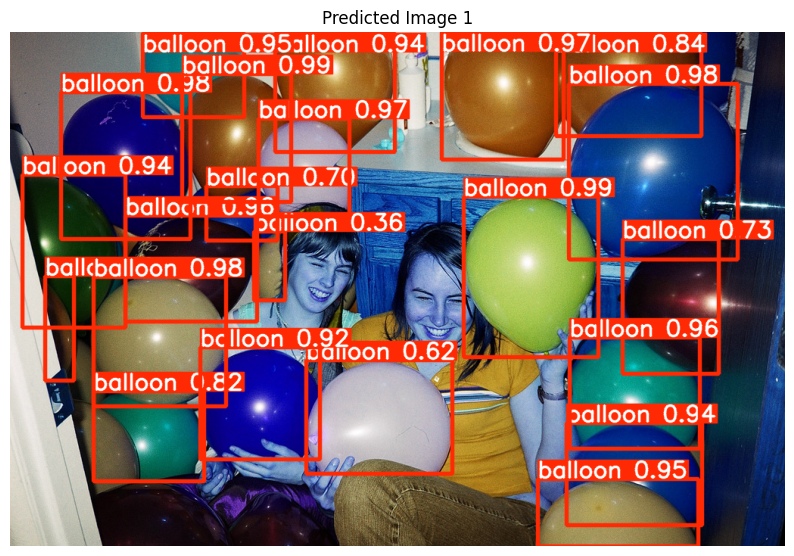

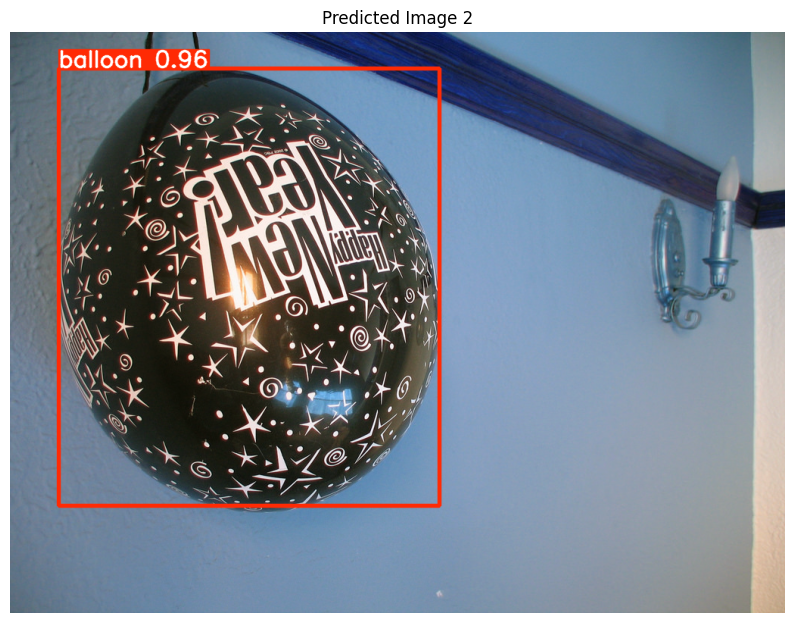

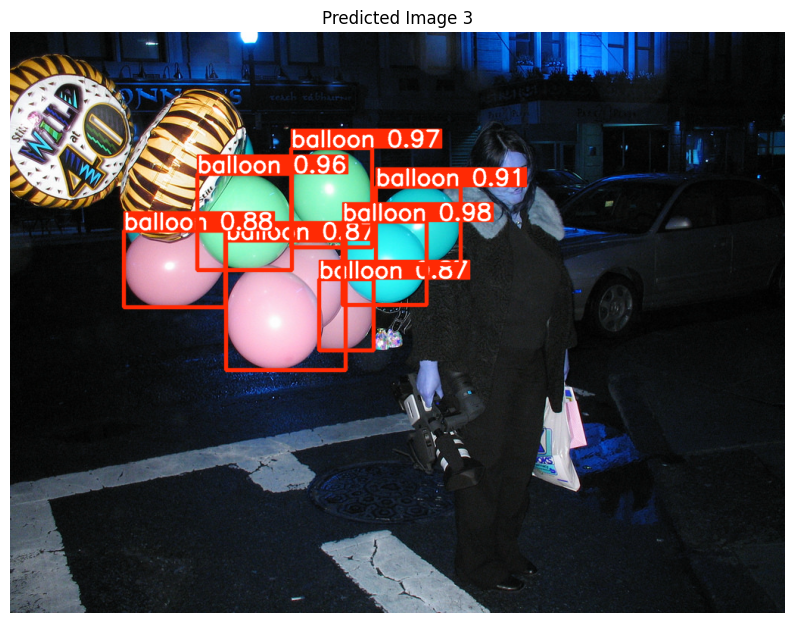

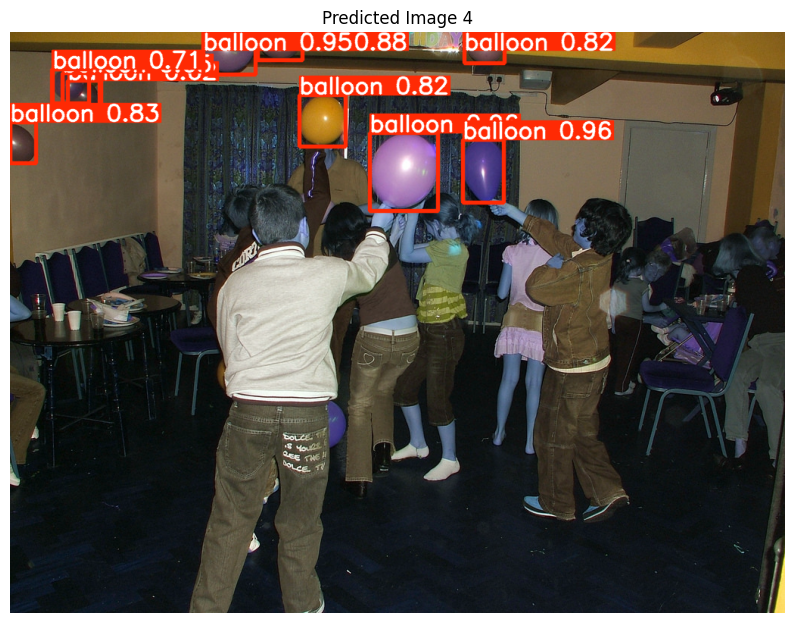

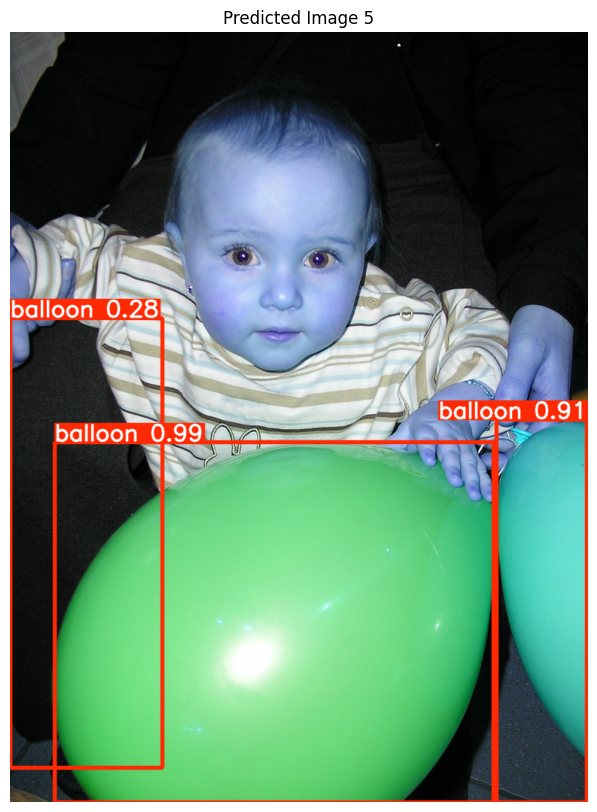

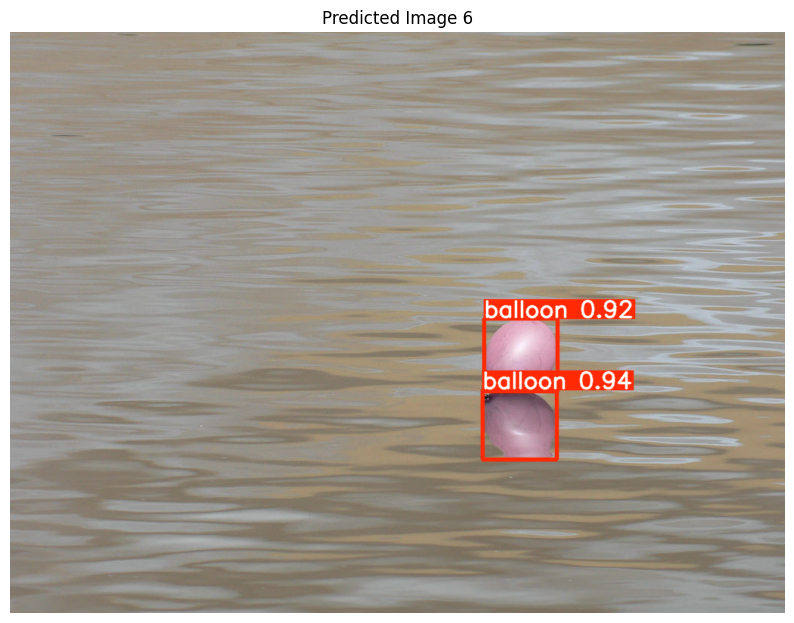

In [2]:
from ultralytics import YOLO
from matplotlib import pyplot as plt

# Load the trained model
model = YOLO("/content/drive/MyDrive/yolo_results_kaggle/balloon_detection_kaggle3/weights/best.pt")

# Perform inference on the images in the specified folder
results = model.predict(
    source="/content/drive/MyDrive/test_baloon_images",
    imgsz=640,
    conf=0.25,
    save=False  # Do not save results
)

# Plot up to 10 predicted images
for i, result in enumerate(results[:10]):  # Limit to 10 images
    # Convert the predicted result to a NumPy array with annotations
    pred_image = result.plot()

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(pred_image)
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted Image {i + 1}")
    plt.show()


# the model which was trained with real images (kaggle dataset) gave very better and close perfect predictions compared to the model trained with generative-ai generated images.